In [1]:
import api_nyt as nyt
import api_wikipedia as wiki
import manage_articles as mng
import statistics
import datetime
import pickle
import timeseries
import TextPreprocessing as txt
from datetime import date
import graphics
import matplotlib.pyplot as plt
import matching
import time
import word
import random
import numpy
from copy import deepcopy
import math

In [2]:
#Load all articles from 2019 and a shuffled copy
articles_original = mng.load_articles("/Users/markus/Downloads/wikinewsPickle/nyt2019.json")
#articles = mng.shuffle_publicationdates(articles)

#Get a dict of dicts for each calendar week with word frequencies from getWordCounts
wordCounts_original = mng.getWordCounts(articles_original)

#List of distinct words 
distinctWords_original = mng.getDistinctWords(wordCounts_original)

#List of lists of tuples containing weekly word frequency
countsPerWeek_original = []
for w in distinctWords_original:
    countsPerWeek_original.append((w,mng.getCountPerWeek(wordCounts_original,w)))   

#Create list of word objects for each keyword
words_original = []
for c in countsPerWeek_original:
    words_original.append(word.Word(c[0],ts_articles=timeseries.Timeseries(c[1])))
#words = sorted(words, key=lambda x: sum(x.ts_articles.getCounts()), reverse=True)
with open("/Users/markus/Downloads/wikinewsPickle/articles_original.txt","wb") as fp:
    pickle.dump(articles_original,fp)
with open("/Users/markus/Downloads/wikinewsPickle/words_original.txt","wb") as fp:
    pickle.dump(words_original,fp)

In [5]:
#Load all articles from 2019 and a shuffled copy
articles_shuffled = mng.load_articles("/Users/markus/Downloads/wikinewsPickle/nyt2019.json")
articles_shuffled = mng.shuffle_publicationdates(articles_shuffled)

#Get a dict of dicts for each calendar week with word frequencies from getWordCounts
wordCounts_shuffled = mng.getWordCounts(articles_shuffled)

#List of distinct words 
distinctWords_shuffled = mng.getDistinctWords(wordCounts_shuffled)

#List of lists of tuples containing weekly word frequency
countsPerWeek_shuffled = []
for w in distinctWords_shuffled:
    countsPerWeek_shuffled.append((w,mng.getCountPerWeek(wordCounts_shuffled,w)))   

#Create list of word objects for each keyword
words_shuffled = []
for c in countsPerWeek_shuffled:
    words_shuffled.append(word.Word(c[0],ts_articles=timeseries.Timeseries(c[1])))
#words = sorted(words, key=lambda x: sum(x.ts_articles.getCounts()), reverse=True)
with open("/Users/markus/Downloads/wikinewsPickle/articles_shuffled.txt","wb") as fp:
    pickle.dump(articles_shuffled,fp)
with open("/Users/markus/Downloads/wikinewsPickle/words_shuffled.txt","wb") as fp:
    pickle.dump(words_shuffled,fp)

In [2]:
#interestingWords_original = mng.filter_interestingness(articles_original, 10, 5)
#interestingWords_shuffled = mng.filter_interestingness(articles_shuffled, 10, 5)

#with open("/Users/markus/Downloads/wikinewsPickle/interestingWords_original.txt","wb") as fp:
#    pickle.dump(interestingWords_original,fp)
#with open("/Users/markus/Downloads/wikinewsPickle/interestingWords_shuffled.txt","wb") as fp:
#    pickle.dump(interestingWords_shuffled,fp)

interestingWords_original = []
with open("/Users/markus/Downloads/wikinewsPickle/interestingWords_original.txt","rb") as fp:
    interestingWords_original = pickle.load(fp)
interestingWords_shuffled = []
with open("/Users/markus/Downloads/wikinewsPickle/interestingWords_shuffled.txt","rb") as fp:
    interestingWords_shuffled = pickle.load(fp)

#For interesting words
keywords_original = []
for k in interestingWords_original:
    keywords_original.append(k)
keywords_shuffled = []
for k in interestingWords_shuffled:
    keywords_shuffled.append(k)

In [3]:
#m = matching.groupmatch(keywords_original, articles_original)
#with open("/Users/markus/Downloads/wikinewsPickle/m.txt","wb") as fp:
#    pickle.dump(m,fp)
m = []
with open("/Users/markus/Downloads/wikinewsPickle/m.txt","rb") as fp:
    m = pickle.load(fp)

In [7]:
#For each returned entry from groupmatch, add wikipedia site and wiki timeseries to word object
for key in m.keys():
    #Following line from 
    #https://stackoverflow.com/questions/7125467/find-object-in-list-that-has-attribute-equal-to-some-value-that-meets-any-condi
    try:
        word = next((x for x in words_original if x.keyword == key), None)
        if word == None:
            print("WORD IS NONE")
        else:
            query = m[key]['query']
            page = m[key]['link'][1]
            wiki_counts = wiki.get_counts(page, word.ts_articles.getStartDate(), word.ts_articles.getEndDate(),"en")
            if wiki_counts is not None:
                #If wikipedia timeseries exists
                word.coocKeywords = query
                word.wikipediaSite = page
                word.ts_wiki = timeseries.parseWikipediaCounts(wiki_counts)
            else:
                print(str(word.keyword) + ", Wiki counts is none")
    except:
        print("ERROR: Key is invalid, " + query + ", " + page)

crisis, Wiki counts is none
japan, Wiki counts is none
militia, Wiki counts is none
eruption, Wiki counts is none
people, Wiki counts is none
many, Wiki counts is none
day, Wiki counts is none
top, Wiki counts is none
two, Wiki counts is none
even, Wiki counts is none
killed, Wiki counts is none


In [12]:
words_analyze_original = [x for x in words_original if x.wikipediaSite != ""]
len(words_analyze_original)
with open("/Users/markus/Downloads/wikinewsPickle/words_analyze_original.txt","wb") as fp:
    pickle.dump(words_analyze_original,fp)

In [4]:
words_analyze_original = []
with open("/Users/markus/Downloads/wikinewsPickle/words_analyze_original.txt","rb") as fp:
    words_analyze_original = pickle.load(fp)

nan


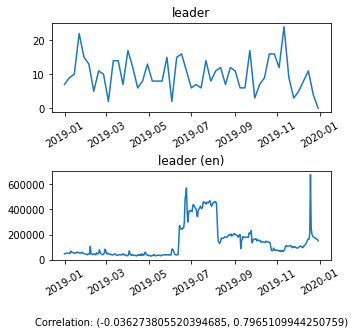

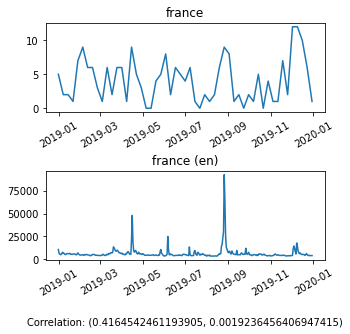

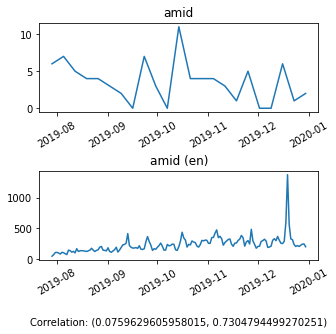

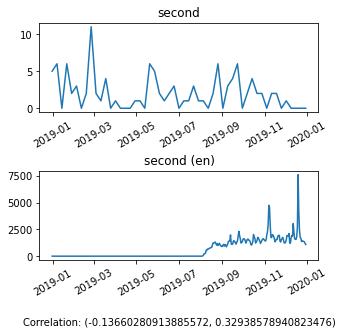

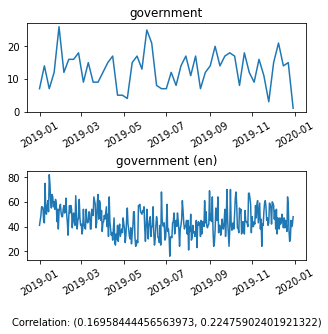

...

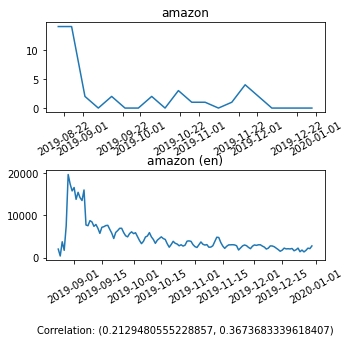

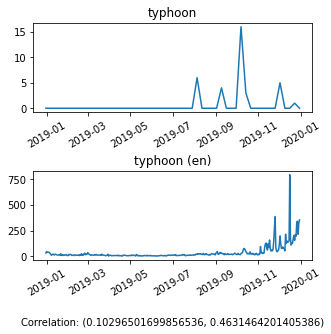

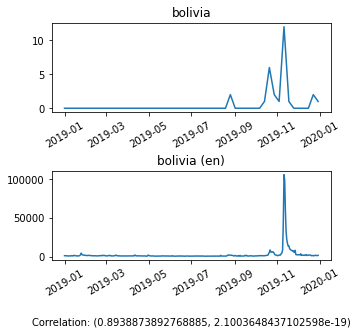

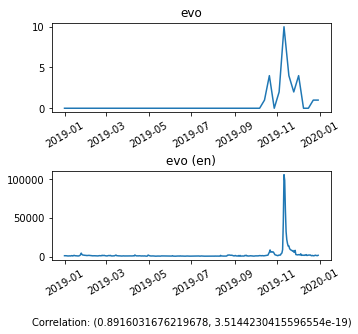

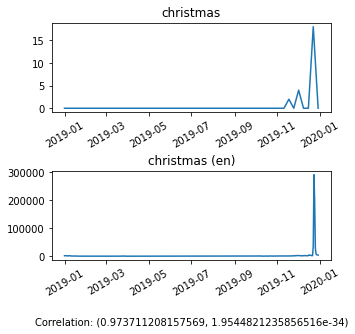

In [5]:
errorList = []
corr_original = []
#Drop all timepoints which are not contained in both article and wikipedia timeseries
for word in words_analyze_original:
    w = deepcopy(word)
    ts_a, ts_w = timeseries.alignTimeseries(w.ts_articles,w.ts_wiki)
    if not(len(ts_w.getCounts())<3 or len(ts_a.getCounts())<3):
        corr_original.append(statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts()))
        graphics.createPDFwithBothPlots(w)
    else:
        errorList.append(w)
print(numpy.mean(corr_original))

In [36]:
import math
numpy.mean([x[0] for x in corr_original if not math.isnan(x[0])])

0.32039596010099436

In [15]:
listwithcorrelations = []
#Data for original
words_analyze_original = []
usedWords = []
with open("/Users/markus/Downloads/wikinewsPickle/words_analyze_original.txt","rb") as fp:
    words_analyze_original = pickle.load(fp)
    
corrs_original = []
for word in words_analyze_original:
    w = deepcopy(word)
    ts_a, ts_w = timeseries.alignTimeseries(w.ts_articles,w.ts_wiki)
    if not(len(ts_w.getCounts())<3 or len(ts_a.getCounts())<3):
        if w.keyword == 'visit':
            print(ts_a.getCounts())
            print(ts_w.getCounts())
            print(statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts())[0])
        usedWords.append(word)
        corrs_original.append((statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts())[0]))
        listwithcorrelations.append((w.keyword,statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts())[0]))

corrs_original = [x for x in corrs_original if not math.isnan(x)]
corrs_original.sort(key=lambda x: x,reverse=False)

x_original = numpy.arange(len(corrs_original))
y_original = numpy.array([x for x in corrs_original])

#Data for random 
#words_analyze_original = []
#with open("/Users/markus/Downloads/wikinewsPickle/words_analyze_original.txt","rb") as fp:
#    words_analyze_original = pickle.load(fp)
words_analyze_original = usedWords

threshold = numpy.mean([x for x in corrs_original])
iterations = 1
runs_1 = []
dic_1 = {}
for k in [x.keyword for x in words_analyze_original]:
    dic_1[k] = []

for iteration in range(iterations):
    run = []
    a = [x for x in range(len(words_analyze_original))]
    b = [x for x in range(len(words_analyze_original))]
    random.shuffle(b)
    for i in range(len(words_analyze_original)):
        ts_a, ts_w = timeseries.alignTimeseries(deepcopy(words_analyze_original[a[i]].ts_articles),deepcopy(words_analyze_original[b[i]].ts_wiki))
        if not (len(ts_w.getCounts())<3 or len(ts_a.getCounts())<3):
            #toAppend = (words_analyze_original[a[i]],statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts()))
            toAppend = statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts())[0]
            #corrs_random_all[i].append(toAppend) 
            run.append(toAppend)
            dic_1[words_analyze_original[a[i]].keyword].append(toAppend)
    runs_1.append(run)



words_analyze_original = usedWords
threshold = numpy.mean([x for x in corrs_original])
iterations = 100
runs_2 = []
dic_2 = {}
for k in [x.keyword for x in words_analyze_original]:
    dic_2[k] = []

for iteration in range(iterations):
    run = []
    a = [x for x in range(len(words_analyze_original))]
    b = [x for x in range(len(words_analyze_original))]
    random.shuffle(b)
    for i in range(len(words_analyze_original)):
        ts_a, ts_w = timeseries.alignTimeseries(deepcopy(words_analyze_original[a[i]].ts_articles),deepcopy(words_analyze_original[b[i]].ts_wiki))
        if not (len(ts_w.getCounts())<3 or len(ts_a.getCounts())<3):
            #toAppend = (words_analyze_original[a[i]],statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts()))
            toAppend = statistics.getCorrelation(ts_a.getCounts(),ts_w.getCounts())[0]
            #corrs_random_all[i].append(toAppend) 
            run.append(toAppend)
            dic_2[words_analyze_original[a[i]].keyword].append(toAppend)
    runs_2.append(run)

[0, 0, 0]
[85458, 4594, 241]
nan


In [16]:
for k in dic_1.keys():
    for v in dic_1[k]:
        if math.isnan(v):
            #print("nan")
            dic_1[k].remove(v)

corrs_random_1 = []
for k in dic_1.keys():
    corrs_random_1.append(numpy.mean(dic_1[k]))
corrs_random_1 = [x for x in corrs_random_1 if not math.isnan(x)]
corrs_random_1.sort(key=lambda x: x,reverse=False)

x_random_1 = numpy.arange(len(corrs_random_1))
y_random_1 = numpy.array([x for x in corrs_random_1])


for k in dic_2.keys():
    for v in dic_2[k]:
        if math.isnan(v):
            #print("nan")
            dic_2[k].remove(v)

corrs_random_2 = []
for k in dic_2.keys():
    corrs_random_2.append(numpy.mean(dic_2[k]))
corrs_random_2 = [x for x in corrs_random_2 if not math.isnan(x)]
corrs_random_2.sort(key=lambda x: x,reverse=False)

x_random_2 = numpy.arange(len(corrs_random_2))
y_random_2 = numpy.array([x for x in corrs_random_2])

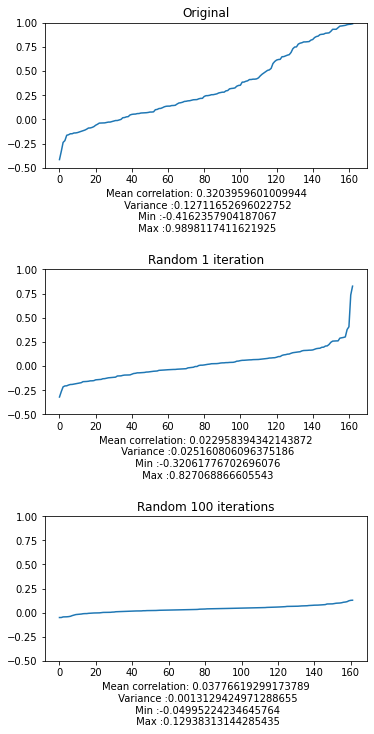

In [17]:
#Create plot
fig = plt.figure(figsize=(5,10))

ax = fig.add_subplot(311)
ax.set_ylim(-0.5,1)
ax.set_xlabel("Mean correlation: " + str(numpy.mean([x for x in corrs_original]))+ "\n Variance :" + str(statistics.getVariance([x for x in corrs_original])) + "\n Min :" + str(min([x for x in corrs_original]))+ "\n Max :" + str(max([x for x in corrs_original])))
plt.plot(x_original,y_original)
plt.title("Original")

ax = fig.add_subplot(312)
ax.set_ylim(-0.5,1)
ax.set_xlabel("Mean correlation: " + str(numpy.mean([x for x in corrs_random_1])) + "\n Variance :" + str(statistics.getVariance([x for x in corrs_random_1]))+ "\n Min :" + str(min([x for x in corrs_random_1]))+ "\n Max :" + str(max([x for x in corrs_random_1])))
plt.title("Random 1 iteration")
plt.plot(x_random_1,y_random_1)

ax = fig.add_subplot(313)
ax.set_ylim(-0.5,1)
ax.set_xlabel("Mean correlation: " + str(numpy.mean([x for x in corrs_random_2])) + "\n Variance :" + str(statistics.getVariance([x for x in corrs_random_2]))+ "\n Min :" + str(min([x for x in corrs_random_2]))+ "\n Max :" + str(max([x for x in corrs_random_2])))
plt.title("Random 100 iterations")
plt.plot(x_random_2,y_random_2)

plt.tight_layout(pad=0, w_pad=0, h_pad=2)